In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

# Install PyTorch
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

# Install YOLOv5 or YOLOv8 (Ultralytics package)
!pip install ultralytics


from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')  # Replace with 'yolov8s.pt' or other versions if needed



Looking in indexes: https://download.pytorch.org/whl/cu118
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 903.1/903.1 kB 24.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 114MB/s]


In [ ]:
from google.colab import drive
import zipfile

# Mount Google Drive
drive.mount('/content/drive')

# Unzip dataset (change the path to where your dataset is saved in Drive)
dataset_zip_path = '/content/drive/My Drive/THerimg dataset/Thermal Imaging.v6i.yolov8.zip'
output_path = '/content/yolov8'

#Unzip the file
with zipfile.ZipFile(dataset_zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_path)

print("Dataset extracted to:", output_path)


Mounted at /content/drive
Dataset extracted to: /content/yolov8


In [ ]:

# Train on your dataset
model.train(data='/content/yolov8/Thermal Imaging.v6i.yolov8/data.yaml', epochs=50, imgsz=640)


Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yolov8/Thermal Imaging.v6i.yolov8/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

100%|██████████| 755k/755k [00:00<00:00, 21.7MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 100MB/s]


AMP: checks passed ✅


train: Scanning /content/yolov8/Thermal Imaging.v6i.yolov8/train/labels... 1676 images, 44 backgrounds, 0 corrupt: 100%|██████████| 1676/1676 [00:00<00:00, 1927.14it/s]

train: New cache created: /content/yolov8/Thermal Imaging.v6i.yolov8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolov8/Thermal Imaging.v6i.yolov8/valid/labels... 102 images, 3 backgrounds, 0 corrupt: 100%|██████████| 102/102 [00:00<00:00, 1711.72it/s]

val: New cache created: /content/yolov8/Thermal Imaging.v6i.yolov8/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       2.2G      1.765      3.546      1.922         39        640: 100%|██████████| 105/105 [00:36<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]

                   all        102        167       0.69      0.128      0.128     0.0473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.15G      1.772      2.988       1.92         42        640: 100%|██████████| 105/105 [00:33<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]

                   all        102        167      0.135      0.245      0.174       0.07



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.15G       1.81      2.849      1.949         33        640: 100%|██████████| 105/105 [00:33<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.70it/s]

                   all        102        167      0.408      0.145      0.159     0.0747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.24G      1.798      2.681      1.949         30        640: 100%|██████████| 105/105 [00:33<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.00it/s]

                   all        102        167      0.587      0.124      0.137     0.0497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.24G      1.787      2.517      1.936         40        640: 100%|██████████| 105/105 [00:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        102        167      0.551      0.196      0.196     0.0981



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.22G      1.726       2.42       1.89         28        640: 100%|██████████| 105/105 [00:29<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        102        167      0.443      0.267      0.222        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.22G      1.732      2.368      1.885         38        640: 100%|██████████| 105/105 [00:31<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]

                   all        102        167      0.392      0.237      0.202     0.0928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.23G      1.676      2.288      1.876         36        640: 100%|██████████| 105/105 [00:33<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        102        167      0.604       0.29      0.253      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.24G      1.696      2.262      1.863         37        640: 100%|██████████| 105/105 [00:32<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        102        167      0.287      0.303      0.282      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.24G      1.661      2.187      1.828         35        640: 100%|██████████| 105/105 [00:33<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]

                   all        102        167      0.283        0.3      0.307      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.24G      1.606      2.097      1.795         32        640: 100%|██████████| 105/105 [00:33<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        102        167      0.673      0.243      0.308      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.23G      1.625      2.078      1.804         32        640: 100%|██████████| 105/105 [00:31<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.68it/s]

                   all        102        167      0.535      0.305      0.341      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.22G      1.579      2.037      1.782         30        640: 100%|██████████| 105/105 [00:31<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        102        167      0.386      0.348      0.341      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.24G      1.588      1.989      1.775         34        640: 100%|██████████| 105/105 [00:30<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        102        167      0.353      0.403      0.359      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.26G      1.572      1.988      1.767         38        640: 100%|██████████| 105/105 [00:31<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        102        167       0.38      0.471       0.38      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.23G      1.574      1.944      1.763         40        640: 100%|██████████| 105/105 [00:33<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.46it/s]

                   all        102        167      0.502      0.395       0.39      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.24G      1.535      1.873      1.745         30        640: 100%|██████████| 105/105 [00:33<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]

                   all        102        167      0.358      0.434      0.404      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.24G      1.501      1.832      1.716         28        640: 100%|██████████| 105/105 [00:33<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.99it/s]

                   all        102        167       0.39       0.51      0.398       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.22G      1.482      1.803      1.689         20        640: 100%|██████████| 105/105 [00:33<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        102        167      0.438      0.398      0.388      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.24G       1.48      1.766      1.696         36        640: 100%|██████████| 105/105 [00:32<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all        102        167      0.441      0.431      0.403      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.22G       1.47      1.736      1.683         38        640: 100%|██████████| 105/105 [00:31<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]


                   all        102        167      0.421      0.378      0.428      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.26G      1.446      1.735      1.658         26        640: 100%|██████████| 105/105 [00:29<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        102        167      0.502       0.53      0.517      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.22G      1.431      1.685      1.655         24        640: 100%|██████████| 105/105 [00:31<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        102        167      0.566      0.507       0.51      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.23G      1.388      1.664      1.632         36        640: 100%|██████████| 105/105 [00:33<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]

                   all        102        167      0.479      0.501      0.441      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.22G      1.407      1.622      1.645         38        640: 100%|██████████| 105/105 [00:33<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.40it/s]

                   all        102        167      0.596      0.557      0.523       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.22G      1.386      1.601      1.637         26        640: 100%|██████████| 105/105 [00:32<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        102        167      0.642      0.515      0.573      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.24G      1.361      1.582      1.604         38        640: 100%|██████████| 105/105 [00:33<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]

                   all        102        167      0.494      0.576      0.546      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.23G      1.318      1.525      1.573         21        640: 100%|██████████| 105/105 [00:32<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all        102        167      0.581      0.563      0.534      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.26G      1.312      1.459      1.566         32        640: 100%|██████████| 105/105 [00:31<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all        102        167      0.627      0.507      0.568      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.24G      1.323      1.475      1.563         33        640: 100%|██████████| 105/105 [00:30<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        102        167      0.545       0.57      0.576        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.24G      1.281      1.458      1.554         28        640: 100%|██████████| 105/105 [00:31<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        102        167      0.594      0.553      0.588      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.23G      1.274      1.441      1.532         36        640: 100%|██████████| 105/105 [00:32<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]

                   all        102        167      0.548      0.591      0.598      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.24G      1.283      1.427      1.536         28        640: 100%|██████████| 105/105 [00:33<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.03it/s]

                   all        102        167       0.64      0.593      0.618      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.24G      1.234      1.332      1.499         29        640: 100%|██████████| 105/105 [00:33<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all        102        167      0.634      0.667      0.676      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.24G      1.229      1.348      1.494         33        640: 100%|██████████| 105/105 [00:32<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.51it/s]

                   all        102        167      0.619      0.643      0.631      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.25G      1.248      1.328      1.506         42        640: 100%|██████████| 105/105 [00:31<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]


                   all        102        167      0.716      0.573      0.651      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.24G      1.179      1.283      1.476         30        640: 100%|██████████| 105/105 [00:30<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all        102        167      0.641      0.563       0.66      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.24G      1.191      1.273      1.462         29        640: 100%|██████████| 105/105 [00:30<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]

                   all        102        167      0.567      0.661      0.645      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.22G      1.151       1.25      1.442         32        640: 100%|██████████| 105/105 [00:32<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.47it/s]

                   all        102        167      0.589      0.631      0.655      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.24G      1.159      1.231      1.451         26        640: 100%|██████████| 105/105 [00:33<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.46it/s]

                   all        102        167       0.58      0.699      0.679      0.381


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.22G      1.144      1.101      1.526         19        640: 100%|██████████| 105/105 [00:34<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all        102        167      0.601      0.709      0.669      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.22G      1.093      1.019      1.493         14        640: 100%|██████████| 105/105 [00:32<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.33it/s]

                   all        102        167        0.7       0.66      0.751      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.22G      1.067     0.9855      1.469         18        640: 100%|██████████| 105/105 [00:30<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        102        167      0.677      0.684       0.72      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.23G      1.041     0.9479      1.442         14        640: 100%|██████████| 105/105 [00:29<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.55it/s]

                   all        102        167      0.706      0.669       0.74      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.22G      1.025     0.9045      1.427         17        640: 100%|██████████| 105/105 [00:32<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.51it/s]

                   all        102        167      0.711      0.721       0.76      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.24G     0.9837     0.8872      1.398         14        640: 100%|██████████| 105/105 [00:32<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]

                   all        102        167        0.8      0.714      0.766       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.22G     0.9818     0.8699      1.379         19        640: 100%|██████████| 105/105 [00:30<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all        102        167      0.731      0.748      0.782       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.23G     0.9732     0.8628      1.387         16        640: 100%|██████████| 105/105 [00:28<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.86it/s]

                   all        102        167      0.732      0.723      0.776      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.22G     0.9467     0.8342      1.361         19        640: 100%|██████████| 105/105 [00:31<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]

                   all        102        167      0.848      0.714       0.81       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.22G     0.9399     0.8443      1.365         15        640: 100%|██████████| 105/105 [00:32<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.63it/s]

                   all        102        167      0.734      0.786      0.796      0.499



50 epochs completed in 0.481 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]


                   all        102        167      0.728      0.794      0.811       0.51
Connectivity Issue-Loose ConnectionCorroded-         37         50      0.571       0.62      0.619      0.328
Deteriorated Insulation         13         14      0.688      0.474      0.631       0.36
Faulty Circuit Breakers         12         19      0.689      0.895      0.827      0.526
Normal Operation Condition         35         45      0.937      0.844      0.928      0.675
   Overloaded Circuits         22         28      0.682      0.929      0.878      0.585
       Phase Imbalance          9         11      0.798          1      0.981      0.585
Speed: 0.2ms preprocess, 3.9ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f4f520eb460>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

In [ ]:
metrics = model.val(data='/content/yolov8/Thermal Imaging.v6i.yolov8/data.yaml')


Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/yolov8/Thermal Imaging.v6i.yolov8/valid/labels.cache... 102 images, 3 backgrounds, 0 corrupt: 100%|██████████| 102/102 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.59it/s]


                   all        102        167      0.728      0.793      0.811      0.515
Connectivity Issue-Loose ConnectionCorroded-         37         50      0.573       0.62       0.62      0.327
Deteriorated Insulation         13         14      0.686       0.47       0.63      0.374
Faulty Circuit Breakers         12         19      0.689      0.895      0.828      0.526
Normal Operation Condition         35         45      0.937      0.844      0.928      0.677
   Overloaded Circuits         22         28      0.684      0.929      0.878      0.586
       Phase Imbalance          9         11      0.799          1      0.981      0.603
Speed: 0.4ms preprocess, 6.1ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to runs/detect/train2


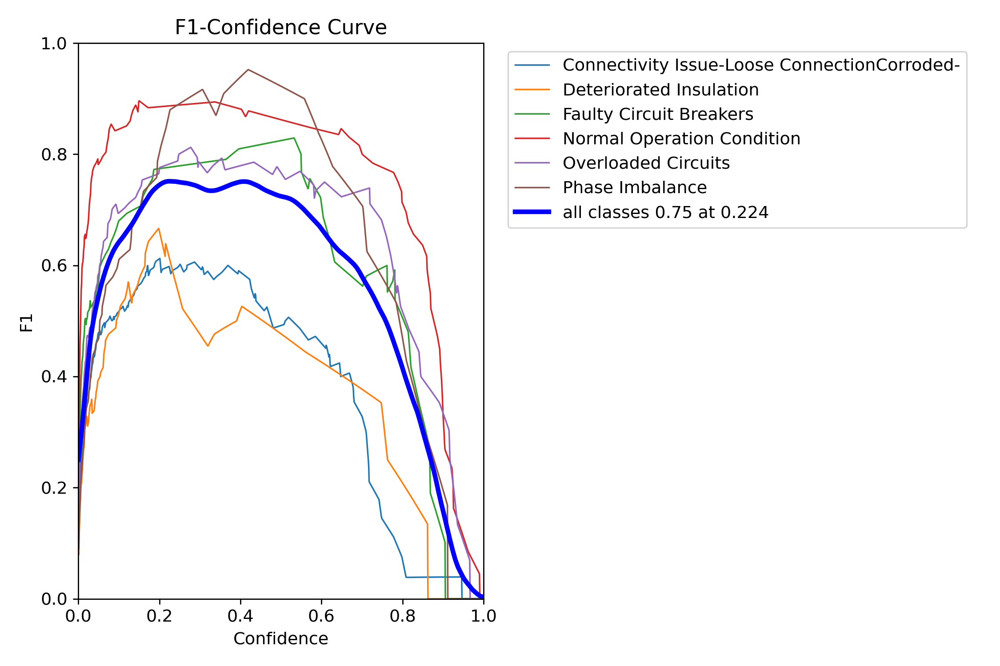

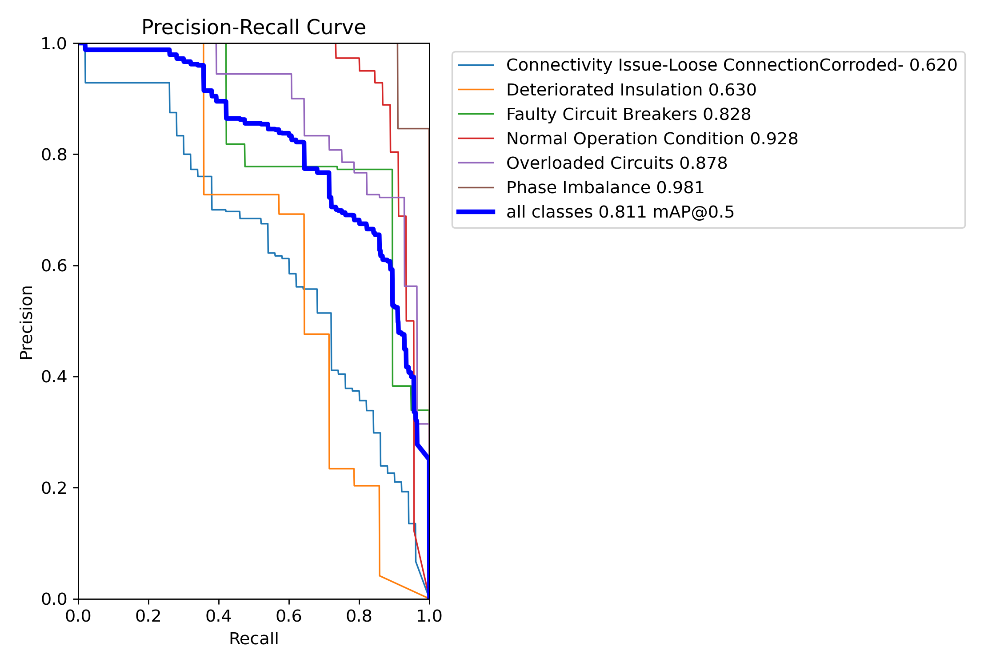

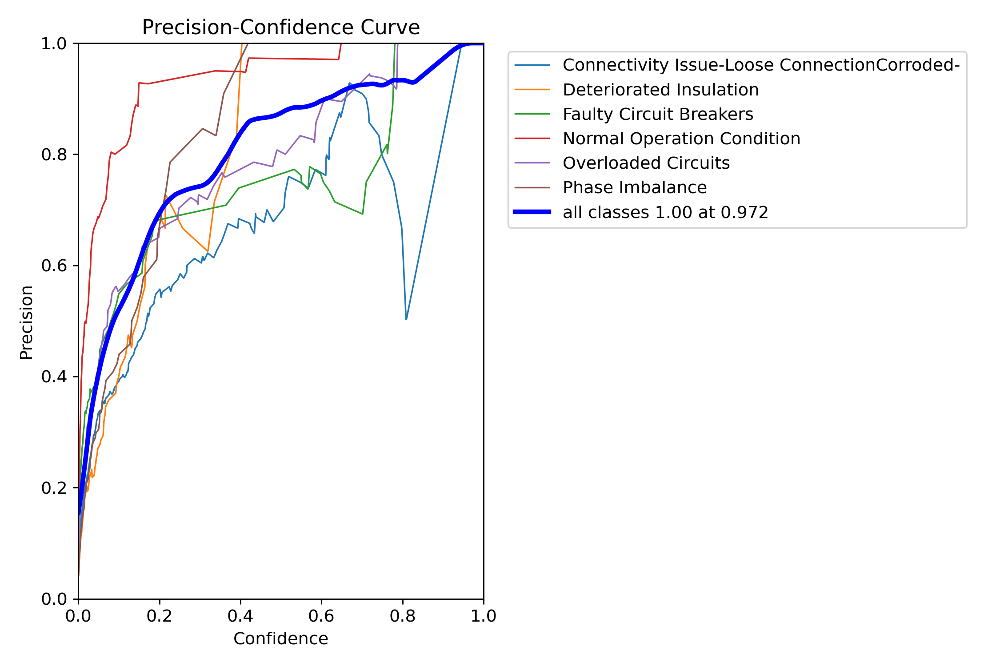

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
from IPython.display import Image, display

# Example: Display specific images
display(Image(filename="runs/detect/train2/F1_curve.png",height=200,width=400))
display(Image(filename="runs/detect/train2/PR_curve.png",height=200,width=400))
display(Image(filename="runs/detect/train2/P_curve.png",height=200,width=400))  # Change as needed
#display(Image(filename="runs/detect/train52/R_curve.png"))




In [ ]:
results = model.predict(source='/content/drive/My Drive/THerimg dataset/Test 1', save=True)



image 1/20 /content/drive/My Drive/THerimg dataset/Test 1/SLOGF20241107101829_jpeg.rf.93dc52a58933451e420fb7bce2801b2c.jpg: 640x640 (no detections), 11.1ms
image 2/20 /content/drive/My Drive/THerimg dataset/Test 1/SLOGF20241107101910_jpeg.rf.9f6d63d100e39e5b95deaab8aa6beb7c.jpg: 640x640 1 Connectivity Issue-Loose ConnectionCorroded-, 2 Overloaded Circuitss, 14.7ms
image 3/20 /content/drive/My Drive/THerimg dataset/Test 1/SLOGF20241107105425_jpeg.rf.578ab469f3156d238a7cffe611ad19e6.jpg: 640x640 2 Faulty Circuit Breakerss, 10.5ms
image 4/20 /content/drive/My Drive/THerimg dataset/Test 1/SLOGF20241107105443_jpeg.rf.f1694cf8cdddc93077e2d69f108b564b.jpg: 640x640 2 Faulty Circuit Breakerss, 1 Normal Operation Condition, 7.5ms
image 5/20 /content/drive/My Drive/THerimg dataset/Test 1/SLOGF20241107105549_jpeg.rf.158cff4151d53e3e64e735d9e69e8d52.jpg: 640x640 1 Normal Operation Condition, 7.5ms
image 6/20 /content/drive/My Drive/THerimg dataset/Test 1/SLOGF20241107113114_jpeg.rf.5c2f022fecfb454

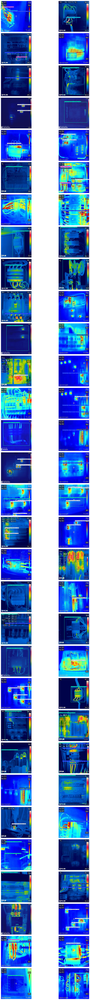

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

# Path to the directory containing annotated images
annotated_images_path = 'runs/detect/train54'  # Replace 'exp' with the correct folder name if different

# List all images in the folder
images = [img for img in os.listdir(annotated_images_path) if img.endswith(('.png', '.jpg', '.jpeg'))]

# Define grid size
rows = 31
cols = 2

# Create a figure for the grid
fig, axs = plt.subplots(rows, cols, figsize=(15, 100))

# Plot each image in the grid
for i, image_file in enumerate(images):
    if i >= rows * cols:  # Stop if there are more images than grid slots
        break
    img = cv2.imread(os.path.join(annotated_images_path, image_file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
    ax = axs[i // cols, i % cols]  # Determine grid position
    ax.imshow(img)
    ax.axis('off')  # Turn off axes
   # ax.set_title(image_file, fontsize=8)  # Add a title with the image name

# Hide unused grid slots if there are fewer images
for j in range(len(images), rows * cols):
    axs[j // cols, j % cols].axis('off')

# Adjust layout and show the grid
plt.tight_layout()
plt.show()
